# <center>Network Science</center>

## <center>Project 1: Social Network Friends</center>

### <center>Student: Evgeniy Tetin</center>

## Introduction

The goal of this project is to look at a network formed by formal friends of the author in a social network [vkontakte](https://vk.com/id9693167). Various properties of the network are studied and visualized where appropriate.

## Obtaining the Network

The network is obtained using VK API.

In [1]:
import requests
import networkx
import time
import collections
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
%matplotlib inline

In [2]:
# Function to get the list of friends

def get_friends_ids(user_id):
    friends_url = 'https://api.vk.com/method/friends.get?user_id={}'
    json_response = requests.get(friends_url.format(user_id)).json()
    if json_response.get('error'):
        return list()
    return json_response[u'response']

In [3]:
# Getting the user's friends and their friends too

user_id = 9693167       # the id of the user for whom the network is being obtained, i.e. vk.com/user_id
friends_network = {}    # set of friend lists of all the user's friends

friends = get_friends_ids(user_id)  # get user's friends

for person in friends:
    # for each person, find all their friends
    friends_network[person] = get_friends_ids(person)

In [4]:
# Initializing the graph of friends

g = networkx.Graph(directed = False)

In [5]:
# Populating the graph

# first of all, add all the user's friends
for i in friends_network:
    g.add_node(i)
    
    # then connect people who are friends with each other
    for j in friends_network[i]:
        if i != j and i in friends and j in friends:
            g.add_edge(i, j)

In [6]:
# Saving the graph in a file for later use in Gephi application

networkx.write_gml(g, "network.gml")

## Network Summary

This is what the network looks like after visualizing it with Gephi.

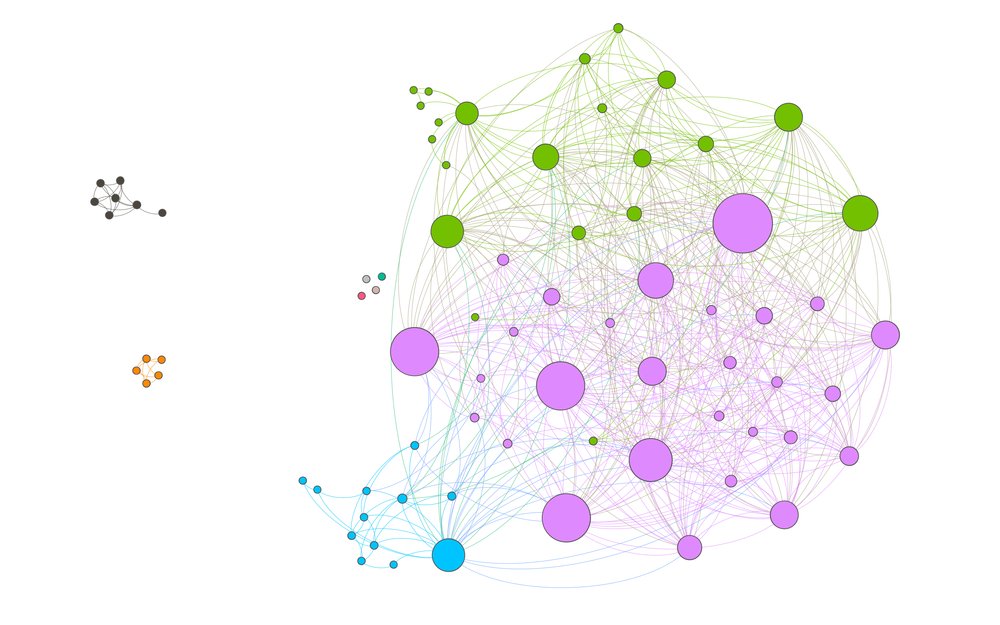

In [7]:
from IPython.display import Image
Image('vk_graph_clean.png')

Nodes have sizes according to their degree and are colored by community affiliation (see below).

### Basic properties of the network

In [8]:
# Number of nodes

g.order()

77

In [9]:
# Number of edges

g.size()

546

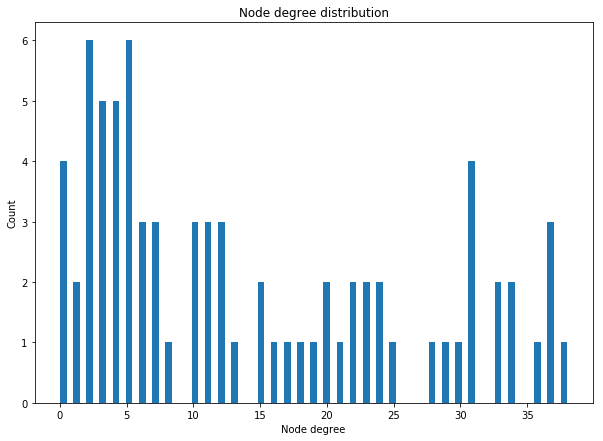

In [10]:
# Degree distribution

k = g.degree()
k = np.array(k.values())
plt.figure(1, figsize = (10, 7))
n, bins, patches = plt.hist(k, bins = 77)
plt.xlabel('Node degree')
plt.ylabel('Count')
plt.title('Node degree distribution')

In [12]:
# Number of connected components

nx.number_connected_components(g)

7

In [13]:
# Clustering coefficient

nx.transitivity(g)

0.6218380778685275

## Structural Analysis

#### Centrality Metrics

In [14]:
dc = nx.degree_centrality(g)

In [15]:
cl = nx.closeness_centrality(g)

In [16]:
bc = nx.betweenness_centrality(g)

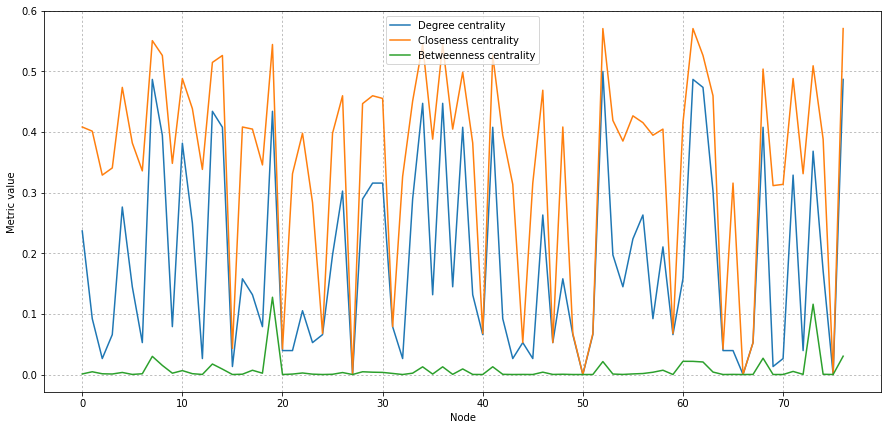

In [17]:
# Plotting centrality metrics for the network

metrics = [dc, cl, bc]
metrics_labels = ['Degree centrality', 'Closeness centrality', 'Betweenness centrality']

fig = plt.figure(1, figsize=(15, 7))
ax = plt.subplot(111)
plt.xlabel('Node')
plt.ylabel('Metric value')

for i in range(len(metrics)):
    ax.plot(metrics[i].values(), label = metrics_labels[i])

ax.legend(loc = 'upper center') # set up legend for the plot
# plt.xticks(np.arange(77))
ax.grid(which = 'both', color = '0.75', linestyle = ':', linewidth = 1)

Based on the results, there cannot be derived anything meaningful from the degree and closeness centralities. The plot for betweenness centrality, on the other hand, clearly shows two distinct nodes with high metric values. The two nodes seem 19 and 73.

Visualizing betweenness centrality for the network in Gephi, we get the following picture.

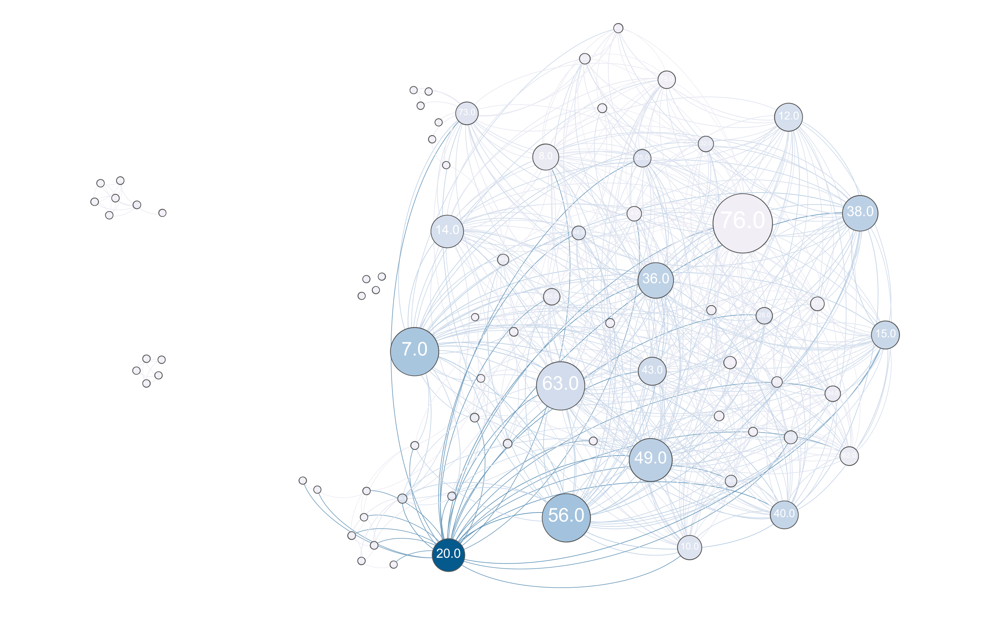

In [18]:
Image('vk_graph_betw.png')

The program only highlights one node as an outlier, and its index is 20.

Interpreting the result, it can be noted that the person behind index 20 in the network is actually a former classmate of the author with whom they also used to play in a band, thus bearing high "connectivity" between two different social circles (school and band).

#### Page Rank

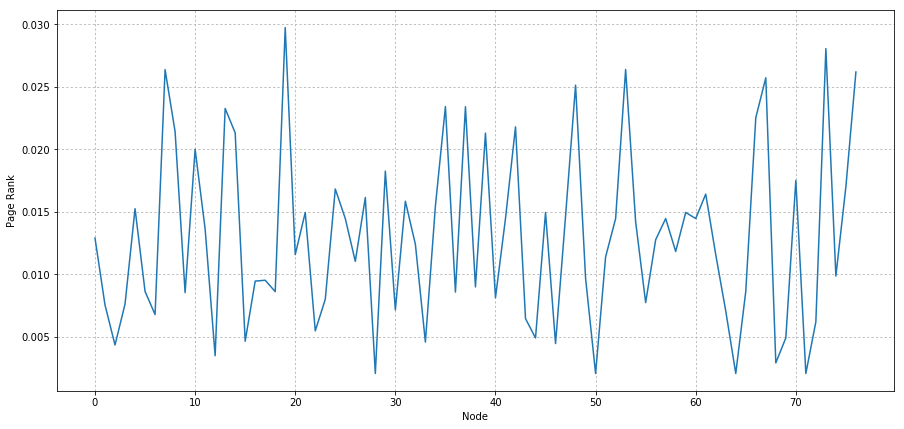

In [19]:
# Computing Page Rank for the network

fig = plt.figure(1, figsize=(15,7))
plt.plot(nx.pagerank(g).values())
plt.xlabel('Node')
plt.ylabel('Page Rank')
plt.grid(which = 'both', color = '0.75', linestyle = ':', linewidth = 1)

#### Community Detection

Network partition into communities is visualized using Gephi.

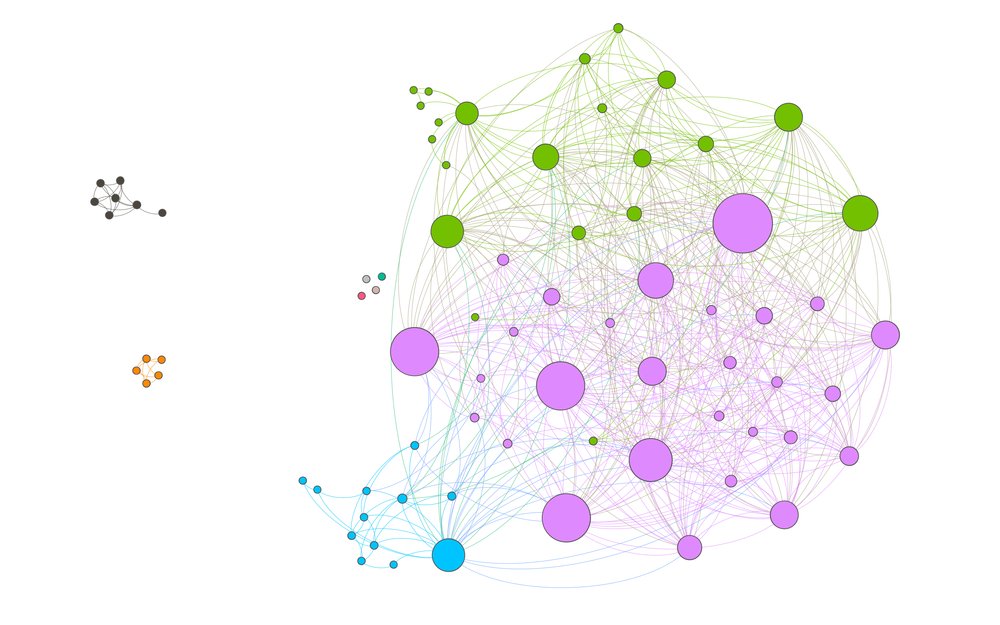

In [20]:
Image('vk_graph_clean.png')

There are five major communities in the network, all colored differently.

| Color                                                       | Community     |
| ----------------------------------------------------------- | ------------- |
| <font color='df89ff' style='font-weight:bold'>Purple</font> | Classmates    |
| <font color='73c000' style='font-weight:bold'>Green</font>  | Schoolmates   |
| <font color='00c4ff' style='font-weight:bold'>Blue</font>   | Bands         |
| <font color='4c463e' style='font-weight:bold'>Grey</font>   | University 1  |
| <font color='ff8805' style='font-weight:bold'>Orange</font> | University 2  |

There are four minor communities, each consisting of a single node. These impersonate people that are known to the author but not to any of his friends.

<hr />

In [21]:
# Procedure to identify the user by their id

def print_info_about(id_interest):  
    resp = requests.get('https://api.vk.com/method/users.get?user_ids={}'.format(id_interest)).json()[u'response']
    print resp[0][u'first_name'].strip() + ' ' + resp[0][u'last_name'].strip()

In [ ]:
# Identifying a user

id_number = 0
print_info_about(G.node[id_number]['label'])